In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!unzip -q /content/drive/MyDrive/CCTV.zip

# 🔵 **Dependncies**

In [3]:
!pip install -q torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 868.8/868.8 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 56.7 MB/s eta 0:00:00


In [4]:
!pip install -q pyyaml

# 🔵 Before you start

In [5]:
!nvidia-smi

Sat Jun 22 23:21:44 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [6]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [7]:
!pip install ultralytics==8.0.196

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 31.1/78.2 GB disk)


In [8]:
from ultralytics import YOLO

from IPython.display import display, Image

# 🔵 **Utils**

In [9]:
import torch
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [10]:
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

In [11]:
class AverageMeter(object):
    """Computes and stores the average and current value"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

In [12]:
def num_trainable_params(model):
  nums = sum(p.numel() for p in model.parameters() if p.requires_grad)/1e6
  return nums

In [13]:
def set_seed(seed):
  np.random.seed(seed)
  torch.manual_seed(seed)
  if torch.cuda.is_available():
      torch.cuda.manual_seed(seed)

# 🔵 **Import**

In [14]:
import torch
from torch import nn, optim
from torch.utils.data import DataLoader, random_split, Dataset

import torchvision
from torchvision import transforms as T
from torchvision import models
from torchvision.models.detection.backbone_utils import BackboneWithFPN

import albumentations as A

import torchmetrics as tm

from sklearn.model_selection import train_test_split

from matplotlib.patches import Rectangle

from torchmetrics.detection import MeanAveragePrecision

import json

from tqdm import tqdm
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
import os
import copy
import yaml
import shutil
from IPython import display
from google.colab import files

In [15]:
print('torch version: ', torch.__version__)
print('torchvision version: ', torchvision.__version__)
print('numpy version: ', np.__version__)
print('pandas version: ', pd.__version__)
print('albumentation version: ', A.__version__)
print('torchmetrics version: ', tm.__version__)

torch version:  2.3.0+cu121
torchvision version:  0.18.0+cu121
numpy version:  1.25.2
pandas version:  2.0.3
albumentation version:  1.3.1
torchmetrics version:  1.4.0.post0


# 🔵 **Dataset**

## 🔵 **Look samples**

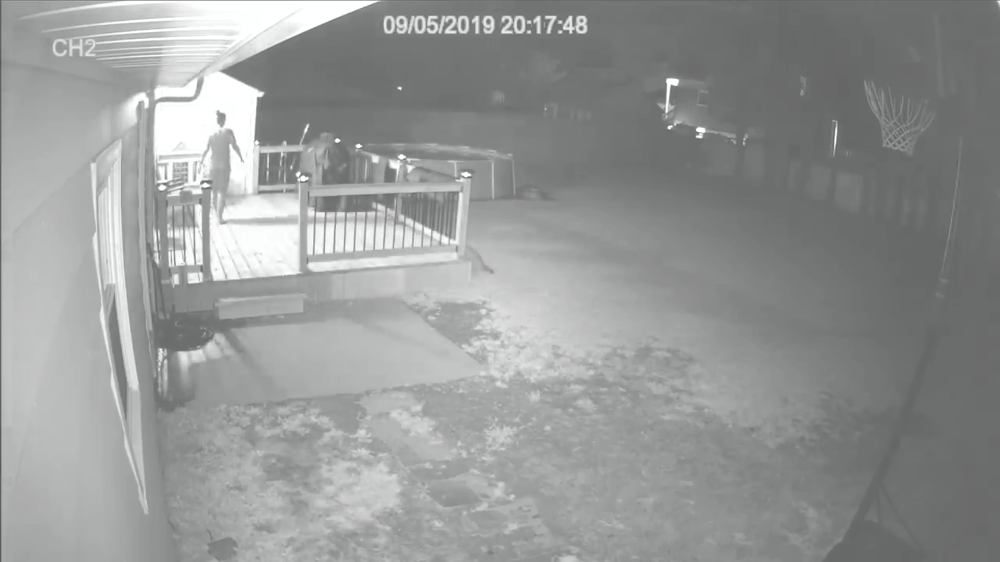

In [16]:
image = Image.open('/content/Images/CCTV_103.png').convert('RGB')
image

In [17]:
images_name = os.listdir('/content/Images/')
len(images_name)

700

In [18]:
images_ann = json.load(open('/content/CCTVAnnotations.json'))['images']
annotation = json.load(open('/content/CCTVAnnotations.json'))['annotations']
categories = json.load(open('/content/CCTVAnnotations.json'))['categories']
len(images_ann), len(annotation)

(700, 933)

In [19]:
images_ann = pd.DataFrame(images_ann)
images_ann

,id,file_name,height,width,license
0,1,CCTV_1.png,720,1280,1
1,2,CCTV_2.png,288,384,1
2,3,CCTV_3.png,1080,1920,1
3,4,CCTV_4.png,480,854,1
4,5,CCTV_5.png,425,634,1
...,...,...,...,...,...
695,696,CCTV_696.png,720,1280,1
696,697,CCTV_697.png,720,1280,1
697,698,CCTV_698.png,480,704,1
698,699,CCTV_699.png,360,480,1


In [20]:
annotation = pd.DataFrame(annotation)
annotation

,id,image_id,iscrowd,bbox,area,num_keypoints,keypoints,category_id
0,1,1,0,"[617.18, 101.71, 119.27, 226.78]",27048,13,"[623.08, 115.95, 2, 624.5, 108.02, 2, 0, 0, 0,...",1
1,2,2,0,"[188.63, 136.61, 44.31, 29.9]",1324,17,"[204.43, 140.91, 2, 204.08, 139.46, 2, 202.74,...",1
2,3,3,0,"[1370.66, 255.98, 35.09, 91.16]",3198,17,"[1394.21, 260.05, 2, 1395.92, 257.5, 2, 1392.5...",1
3,4,3,0,"[9.91, 81.62, 1329.1, 218.45]",290341,16,"[1334.58, 209.97, 2, 0, 0, 0, 1330.69, 208.99,...",1
4,5,4,0,"[130.37, 162.24, 44.98, 106.72]",4800,15,"[135.51, 165.24, 2, 136.44, 162.24, 2, 0, 0, 0...",1
...,...,...,...,...,...,...,...,...
928,929,696,0,"[184.93, 78.3, 97.56, 218.27]",21294,16,"[233.39, 86.74, 2, 234.53, 78.3, 2, 225.3, 81....",1
929,930,697,0,"[272.04, 226.98, 54.56, 133.95]",7308,11,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1
930,931,698,0,"[187.72, 143.88, 64.4, 72.05]",4640,11,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1
931,932,699,0,"[232.53, 52.82, 66.41, 128.02]",8501,14,"[285.09, 54.86, 2, 287.99, 52.82, 2, 0, 0, 0, ...",1


In [21]:
annotation[annotation['image_id'] == 3]

,id,image_id,iscrowd,bbox,area,num_keypoints,keypoints,category_id
2,3,3,0,"[1370.66, 255.98, 35.09, 91.16]",3198,17,"[1394.21, 260.05, 2, 1395.92, 257.5, 2, 1392.5...",1
3,4,3,0,"[9.91, 81.62, 1329.1, 218.45]",290341,16,"[1334.58, 209.97, 2, 0, 0, 0, 1330.69, 208.99,...",1


In [22]:
images_name = []
for id in annotation['image_id']:
  images_name.append(images_ann[images_ann['id'] == id]['file_name'].values[0])

In [23]:
annotation['file_name'] = images_name

In [24]:
annotation

,id,image_id,iscrowd,bbox,area,num_keypoints,keypoints,category_id,file_name
0,1,1,0,"[617.18, 101.71, 119.27, 226.78]",27048,13,"[623.08, 115.95, 2, 624.5, 108.02, 2, 0, 0, 0,...",1,CCTV_1.png
1,2,2,0,"[188.63, 136.61, 44.31, 29.9]",1324,17,"[204.43, 140.91, 2, 204.08, 139.46, 2, 202.74,...",1,CCTV_2.png
2,3,3,0,"[1370.66, 255.98, 35.09, 91.16]",3198,17,"[1394.21, 260.05, 2, 1395.92, 257.5, 2, 1392.5...",1,CCTV_3.png
3,4,3,0,"[9.91, 81.62, 1329.1, 218.45]",290341,16,"[1334.58, 209.97, 2, 0, 0, 0, 1330.69, 208.99,...",1,CCTV_3.png
4,5,4,0,"[130.37, 162.24, 44.98, 106.72]",4800,15,"[135.51, 165.24, 2, 136.44, 162.24, 2, 0, 0, 0...",1,CCTV_4.png
...,...,...,...,...,...,...,...,...,...
928,929,696,0,"[184.93, 78.3, 97.56, 218.27]",21294,16,"[233.39, 86.74, 2, 234.53, 78.3, 2, 225.3, 81....",1,CCTV_696.png
929,930,697,0,"[272.04, 226.98, 54.56, 133.95]",7308,11,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1,CCTV_697.png
930,931,698,0,"[187.72, 143.88, 64.4, 72.05]",4640,11,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1,CCTV_698.png
931,932,699,0,"[232.53, 52.82, 66.41, 128.02]",8501,14,"[285.09, 54.86, 2, 287.99, 52.82, 2, 0, 0, 0, ...",1,CCTV_699.png


In [25]:
def show_random_joints_on_image(annotation, data_dir, number):
  images_name = np.unique(np.array(annotation['file_name'].values))
  r = random.sample(range(0, len(images_name)), number)
  plt.figure(figsize = (20, 20 ))
  plt.subplot(int(np.sqrt(number)) + 1, int(np.sqrt(number)) + 1, 1)
  id = images_name[r[0]]
  joints = np.array([j for j in annotation[annotation['file_name'] == id]['keypoints'].values]).tolist()
  boxs = np.array([k for k in annotation[annotation['file_name'] == id]['bbox'].values]).tolist()
  def plot(id, joints, boxs):
    for i in range(len(boxs)):
      joint = np.array(joints[i])
      box = boxs[i]

      x = joint[0::3]
      y = joint[1::3]
      v = joint[2::3]
      im = Image.open(f'{data_dir}/{id}').convert('RGB')
      plt.imshow(im)
      plt.scatter(x, y)
      ax = plt.gca()
      rect =  Rectangle((box[0], box[1]),
                        (box[2]),
                        (box[3]),
                        fill = False,
                        edgecolor = (1, 0, 0),
                        linewidth = 2)
      ax.add_patch(rect)

  plot(id, joints, boxs)
  plt.axis('off')
  for i in range(number - 1):
    plt.subplot(int(np.sqrt(number)) + 1, int(np.sqrt(number)) + 1 , i+2)
    id = images_name[r[i+1]]
    joints = np.array([j for j in annotation[annotation['file_name'] == id]['keypoints'].values]).tolist()
    boxs = np.array([k for k in annotation[annotation['file_name'] == id]['bbox'].values]).tolist()
    plot(id, joints, boxs)
    plt.axis('off')
  plt.show()

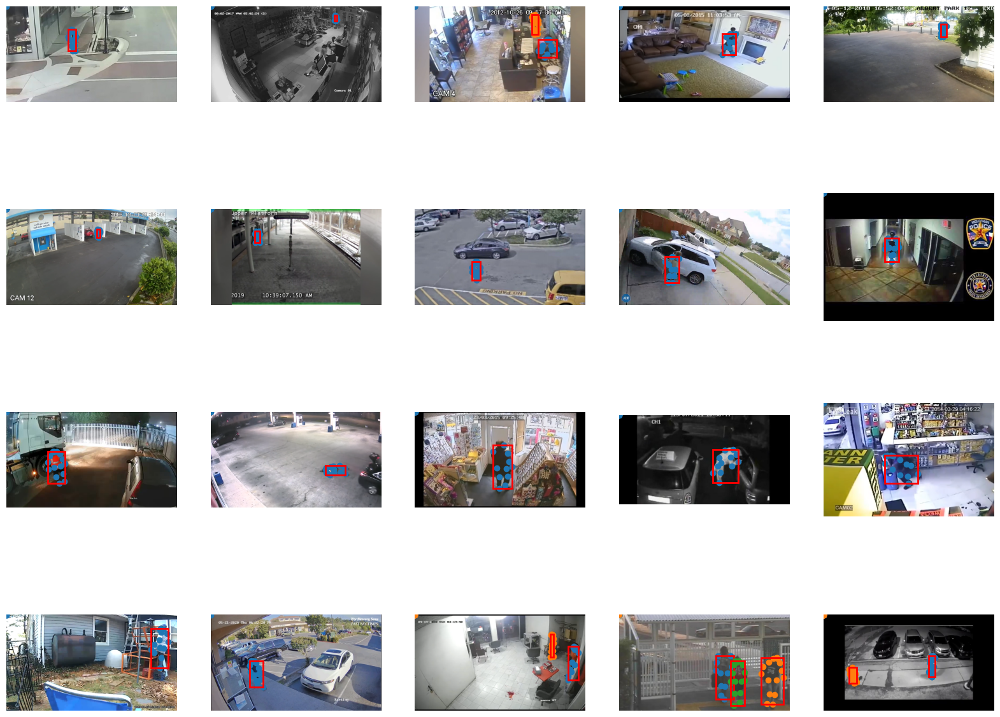

In [26]:
show_random_joints_on_image(annotation, '/content/Images', 20)

## 🔵 **Split**

In [27]:
images_name = np.array(np.unique(annotation['file_name'].tolist()))
images_name.shape

(700,)

In [28]:
train_im, valid_im = train_test_split(images_name, test_size = 0.3, random_state = 42)
valid_im, test_im  = train_test_split(valid_im, test_size = 0.5, random_state = 42)
train_im.shape, valid_im.shape, test_im.shape

((490,), (105,), (105,))

In [29]:
def change(file):
  new = []
  for id in file:
    [new.append(v) for v in annotation[annotation['file_name'] == id].values.tolist()]

  return pd.DataFrame(new, columns = annotation.columns)
train_df = change(train_im)
valid_df = change(valid_im)
test_df  = change(test_im)
train_df.shape, valid_df.shape, test_df.shape

((642, 9), (151, 9), (140, 9))

In [30]:
train_df[train_df['file_name'] == 'CCTV_294.png']['bbox'].values[0][3] = 352.5
train_df[train_df['file_name'] == 'CCTV_501.png']['bbox'].values[0][3] = 464.2
valid_df[valid_df['file_name'] == 'CCTV_241.png']['bbox'].values[0][3] = 372

In [31]:
train_df

,id,image_id,iscrowd,bbox,area,num_keypoints,keypoints,category_id,file_name
0,569,420,0,"[787.67, 354.0, 209.81, 232.3]",48738,9,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1,CCTV_420.png
1,570,420,0,"[430.95, 221.36, 223.57, 457.21]",102218,12,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1,CCTV_420.png
2,914,684,0,"[814.64, 124.04, 77.91, 199.73]",15560,11,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 865.88, 1...",1,CCTV_684.png
3,485,361,0,"[117.51, 131.01, 56.43, 140.76]",7943,17,"[141.71, 135.79, 2, 143.34, 131.01, 2, 138.24,...",1,CCTV_361.png
4,638,478,0,"[271.24, 257.41, 88.15, 196.0]",17277,16,"[288.96, 262.37, 2, 292.1, 257.41, 2, 287.16, ...",1,CCTV_478.png
...,...,...,...,...,...,...,...,...,...
637,255,195,0,"[332.28, 182.41, 128.05, 190.91]",24446,15,"[419.77, 193.48, 2, 0, 0, 0, 414.87, 187.45, 2...",1,CCTV_195.png
638,458,342,0,"[208.69, 107.23, 35.25, 55.09]",1941,12,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1,CCTV_342.png
639,459,342,0,"[3.63, 94.09, 39.47, 18.25]",720,6,"[0, 0, 0, 0, 0, 0, 3.63, 0, 0, 0, 0, 0, 0, 0, ...",1,CCTV_342.png
640,655,491,0,"[200.05, 66.48, 23.83, 37.72]",898,14,"[223.49, 68.51, 2, 223.88, 66.88, 2, 222.98, 6...",1,CCTV_491.png


In [32]:
def preprocessing(data, image_names):
  images = []
  bboxes = []
  labels = []
  keypoints = []
  for image in image_names:
    sample_info = data[data['file_name'] == image]
    bbox        = [[sample_info['bbox'].iloc[i][0] + sample_info['bbox'].iloc[i][2]/2, sample_info['bbox'].iloc[i][1] + sample_info['bbox'].iloc[i][3]/2,
                    sample_info['bbox'].iloc[i][2], sample_info['bbox'].iloc[i][3]] for i in range(sample_info.shape[0])]

    keyp       = [sample_info['keypoints'].iloc[i] for i in range(sample_info.shape[0])]

    label = [0] * len(bbox)

    images.append(image)
    bboxes.append(bbox)
    labels.append(label)
    keypoints.append(keyp)

  return pd.DataFrame([images, bboxes, labels, keypoints], index = ['image_names', 'bboxes', 'labels', 'keypoints']).transpose()


In [33]:
train_df = preprocessing(train_df, train_im)
valid_df = preprocessing(valid_df, valid_im)
test_df  = preprocessing(test_df, test_im)
train_df.shape, valid_df.shape, test_df.shape

((490, 4), (105, 4), (105, 4))

In [34]:
train_df.to_csv('train_df.csv')
valid_df.to_csv('valid_df.csv')
test_df.to_csv('test_df.csv')

## 🔵 **Create Label files**

In [35]:
!mkdir /content/datasets

In [36]:
try:
  print(os.listdir('/content/datasets/CCTV/'))
  print('!all folder already exist!')
except:
  !mkdir /content/datasets/CCTV/
  !mkdir /content/datasets/CCTV/train/
  !mkdir /content/datasets/CCTV/train/images/
  !mkdir /content/datasets/CCTV/train/labels/
  !mkdir /content/datasets/CCTV/valid/
  !mkdir /content/datasets/CCTV/valid/images/
  !mkdir /content/datasets/CCTV/valid/labels/
  !mkdir /content/datasets/CCTV/test/
  !mkdir /content/datasets/CCTV/test/images/
  !mkdir /content/datasets/CCTV/test/labels/

In [37]:
try:
  with open('/content/datasets/CCTV/data.yaml') as f:
    print(yaml.safe_load(f)['names'])
  print('!data file already exist!')
except:
  my_dict = {}
  my_dict['names'] = ['human']
  my_dict['kpt_shape'] = [17, 3]
  my_dict['flip_idx'] =  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
  #my_dict['nc'] = 1
  my_dict['test'] = 'test/images'
  my_dict['train'] = 'train/images'
  my_dict['val'] = 'valid/images'
  with open('/content/datasets/CCTV/data.yaml', 'w') as outfile:
    yaml.dump(my_dict, outfile, default_flow_style=False)

In [38]:
def create_dataset(df, phase):
  for i in range(df.shape[0]):
    display.clear_output(wait = True)
    sample = df.iloc[i]
    boxes = np.array(sample['bboxes'])
    image = T.functional.to_tensor(Image.open(f"/content/Images/{sample['image_names']}").convert('RGB'))
    height, width = image.shape[1:]
    boxes = np.array(sample['bboxes'])/[width, height, width, height]
    labels = np.array(sample['labels'])
    keyp = np.array(sample['keypoints'])
    for i in range(keyp.shape[0]):
      keyp[i] = keyp[i]/([width, height, 1] * 17)
    infos = np.concatenate((labels.reshape(labels.shape[0], 1), boxes, keyp), axis = 1)
    image_name = sample['image_names']
    try:
      a = Image.open(f"/content/datasets/CCTV/{phase}/images/{image_name}").convert('RGB')
      print(f'image <<{image_name}>> already exist!')
    except:
      shutil.copy(f"/content/Images/{image_name}", f'/content/datasets/CCTV/{phase}/images/')
      print(f'image <<{image_name}>> moved!')
    try:
      a = np.loadtxt(f"/content/datasets/CCTV/{phase}/labels/{image_name.split('.png')[0]}.txt")
      print(f'label <<{image_name}>> already exist!')
    except:
      np.savetxt(f"/content/datasets/CCTV/{phase}/labels/{image_name.split('.png')[0]}.txt", infos)
      print(f"label{image_name.split('.png')[0]}.txt created!")

In [39]:
create_dataset(train_df, 'train')

image <<CCTV_191.png>> moved!
labelCCTV_191.txt created!


In [40]:
create_dataset(valid_df, 'valid')

image <<CCTV_677.png>> moved!
labelCCTV_677.txt created!


In [41]:
create_dataset(test_df, 'test')

image <<CCTV_621.png>> moved!
labelCCTV_621.txt created!


# 🔵 **Train 0-150**

In [ ]:
%cd {HOME}

!yolo task=pose mode=train model=yolov8l-pose.pt data=/content/datasets/CCTV/data.yaml epochs=150 batch=16 imgsz=640 plots=True patience=200

In [ ]:
!cp /content/runs/pose/train/weights/best.pt /content/drive/MyDrive/

# 🔵 **Result 0-150**

In [ ]:
!ls {HOME}/runs/pose/train/

args.yaml					    PoseF1_curve.png	 train_batch4341.jpg
BoxF1_curve.png					    PoseP_curve.png	 train_batch4342.jpg
BoxP_curve.png					    PosePR_curve.png	 val_batch0_labels.jpg
BoxPR_curve.png					    PoseR_curve.png	 val_batch0_pred.jpg
BoxR_curve.png					    results.csv		 val_batch1_labels.jpg
confusion_matrix_normalized.png			    results.png		 val_batch1_pred.jpg
confusion_matrix.png				    train_batch0.jpg	 val_batch2_labels.jpg
events.out.tfevents.1719071674.3cfe722c792b.1568.0  train_batch1.jpg	 val_batch2_pred.jpg
labels_correlogram.jpg				    train_batch2.jpg	 weights
labels.jpg					    train_batch4340.jpg


/content


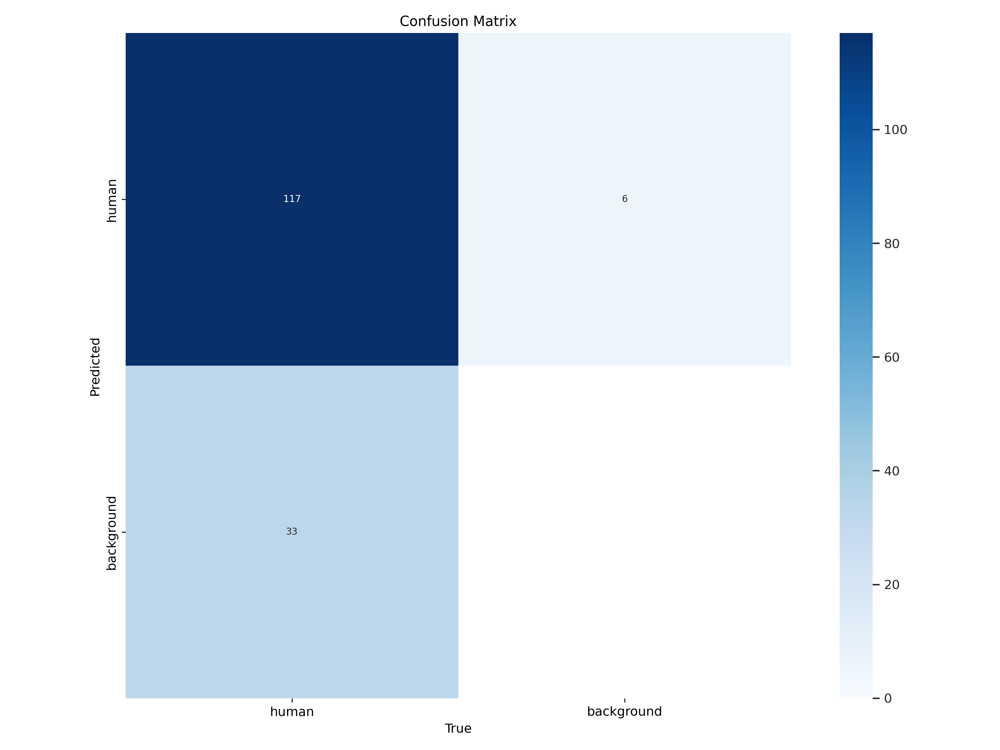

In [ ]:
%cd {HOME}
from IPython.display import Image
Image(filename=f'{HOME}/runs/pose/train/confusion_matrix.png', width=600)

/content


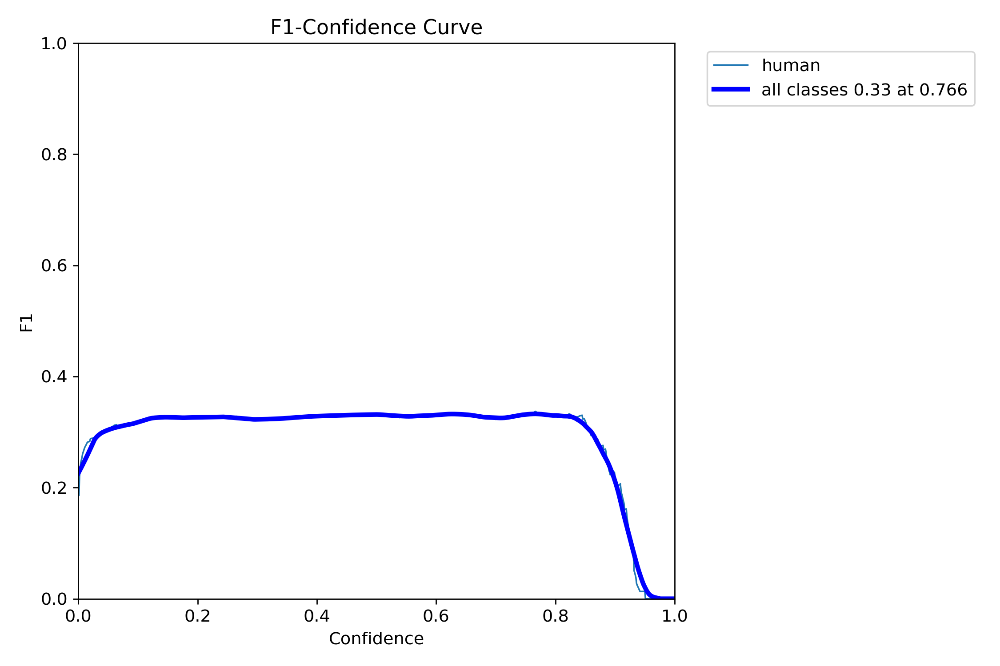

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/pose/train/PoseF1_curve.png', width=600)

/content


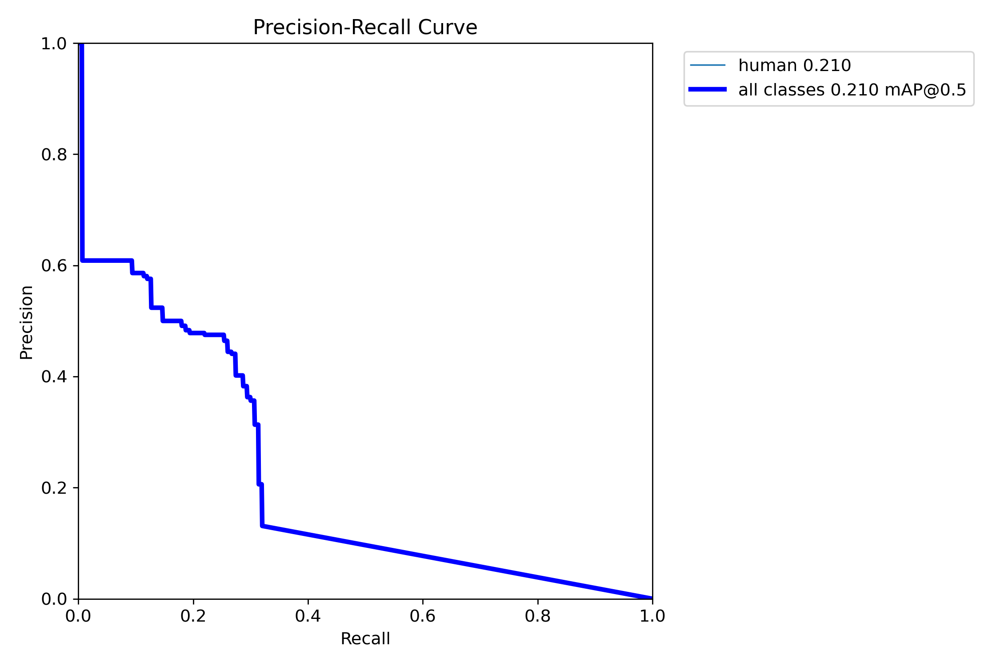

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/pose/train/PosePR_curve.png', width=600)

/content


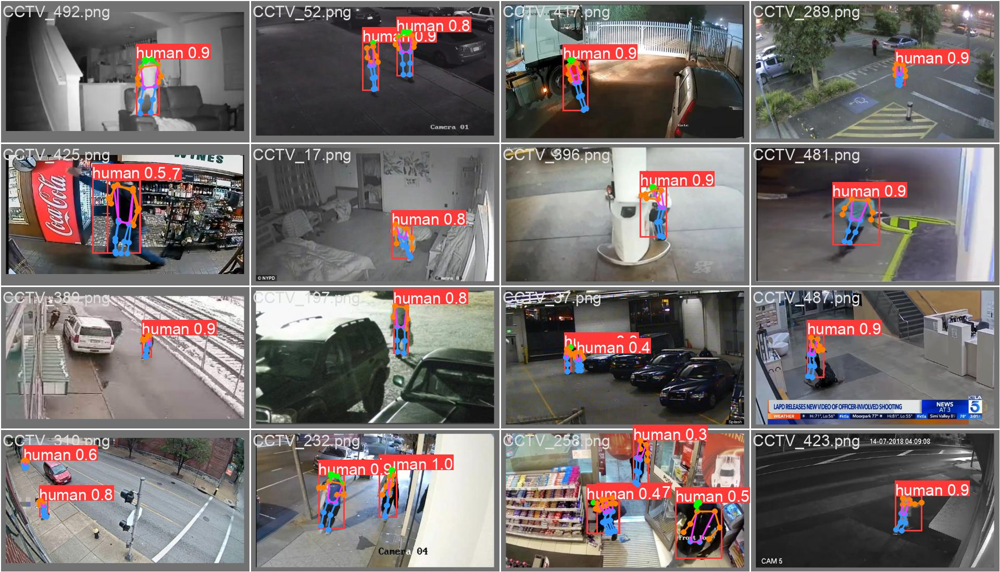

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/pose/train/val_batch0_pred.jpg', width=600)

# 🔵 **Train 150-250**

In [ ]:
%cd {HOME}

!yolo task=pose mode=train model=/content/best.pt data=/content/datasets/CCTV/data.yaml epochs=100 batch=16 imgsz=640 plots=True patience=200 lr0=0.001

In [ ]:
!cp /content/runs/pose/train/weights/best.pt /content/drive/MyDrive/

# 🔵 **Result 150-250**

In [ ]:
!ls {HOME}/runs/pose/train/

args.yaml					    PoseF1_curve.png	 train_batch2792.jpg
BoxF1_curve.png					    PoseP_curve.png	 train_batch2.jpg
BoxP_curve.png					    PosePR_curve.png	 val_batch0_labels.jpg
BoxPR_curve.png					    PoseR_curve.png	 val_batch0_pred.jpg
BoxR_curve.png					    results.csv		 val_batch1_labels.jpg
confusion_matrix_normalized.png			    results.png		 val_batch1_pred.jpg
confusion_matrix.png				    train_batch0.jpg	 val_batch2_labels.jpg
events.out.tfevents.1719084040.57250b0ad820.3944.0  train_batch1.jpg	 val_batch2_pred.jpg
labels_correlogram.jpg				    train_batch2790.jpg  weights
labels.jpg					    train_batch2791.jpg


/content


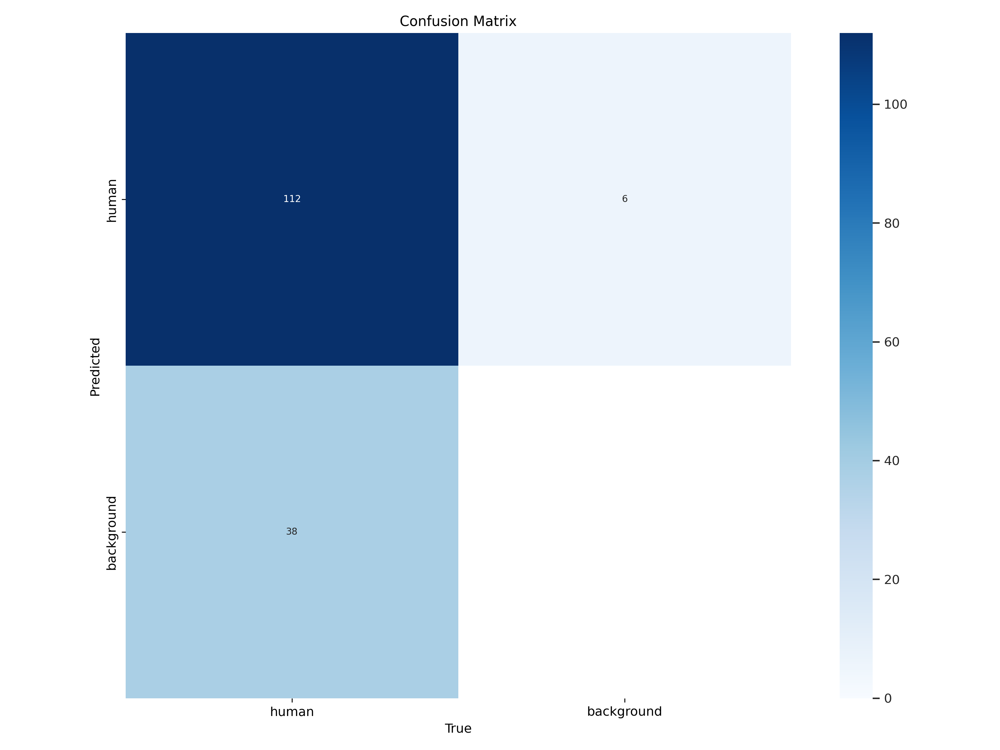

In [ ]:
%cd {HOME}
from IPython.display import Image
Image(filename=f'{HOME}/runs/pose/train/confusion_matrix.png', width=600)

/content


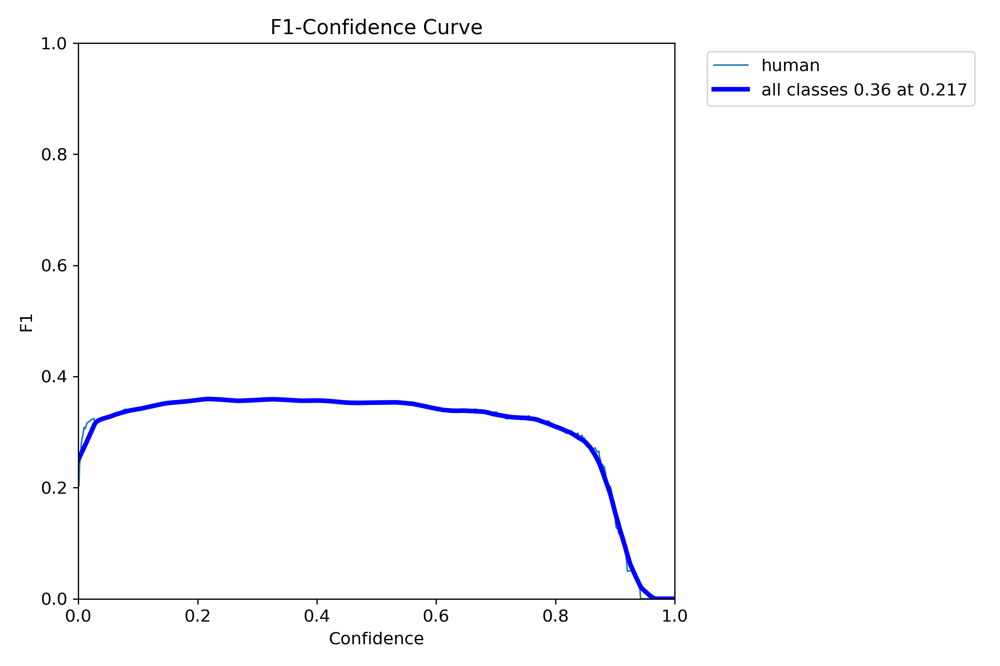

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/pose/train/PoseF1_curve.png', width=600)

/content


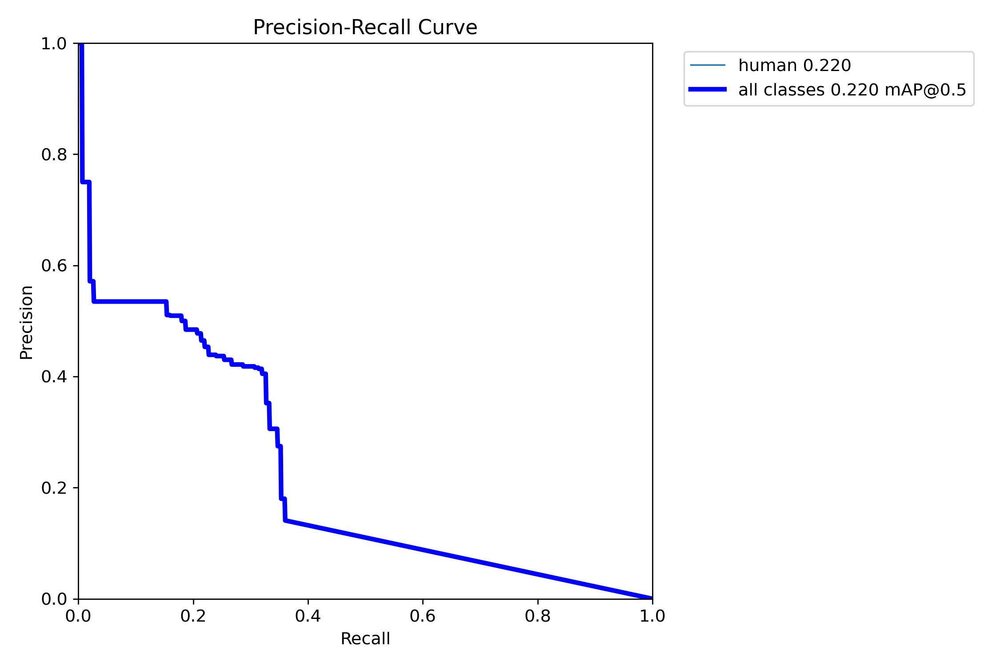

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/pose/train/PosePR_curve.png', width=600)

/content


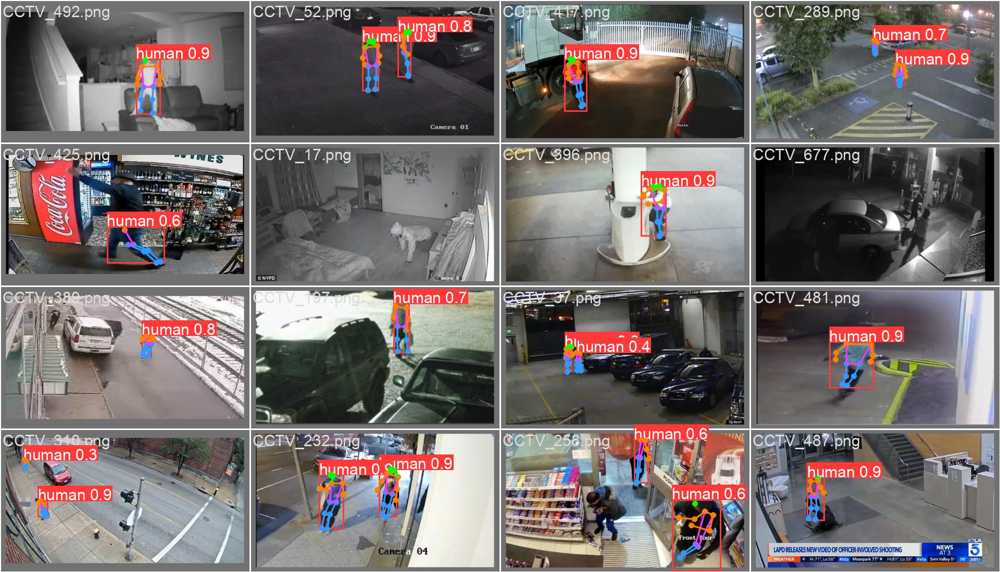

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/pose/train/val_batch0_pred.jpg', width=600)

# 🔵 **Train 250-400**

In [ ]:
%cd {HOME}

!yolo task=pose mode=train model=/content/best.pt data=/content/datasets/CCTV/data.yaml epochs=120 batch=16 imgsz=640 plots=True patience=200 lr0=0.0005 warmup_bias_lr=0.01

In [ ]:
!cp /content/runs/pose/train/weights/best.pt /content/drive/MyDrive/

# 🔵 **Result 250-400**

In [ ]:
!ls {HOME}/runs/pose/train/

args.yaml					    PoseF1_curve.png	 train_batch3411.jpg
BoxF1_curve.png					    PoseP_curve.png	 train_batch3412.jpg
BoxP_curve.png					    PosePR_curve.png	 val_batch0_labels.jpg
BoxPR_curve.png					    PoseR_curve.png	 val_batch0_pred.jpg
BoxR_curve.png					    results.csv		 val_batch1_labels.jpg
confusion_matrix_normalized.png			    results.png		 val_batch1_pred.jpg
confusion_matrix.png				    train_batch0.jpg	 val_batch2_labels.jpg
events.out.tfevents.1719090231.75c9ba28864f.5962.0  train_batch1.jpg	 val_batch2_pred.jpg
labels_correlogram.jpg				    train_batch2.jpg	 weights
labels.jpg					    train_batch3410.jpg


/content


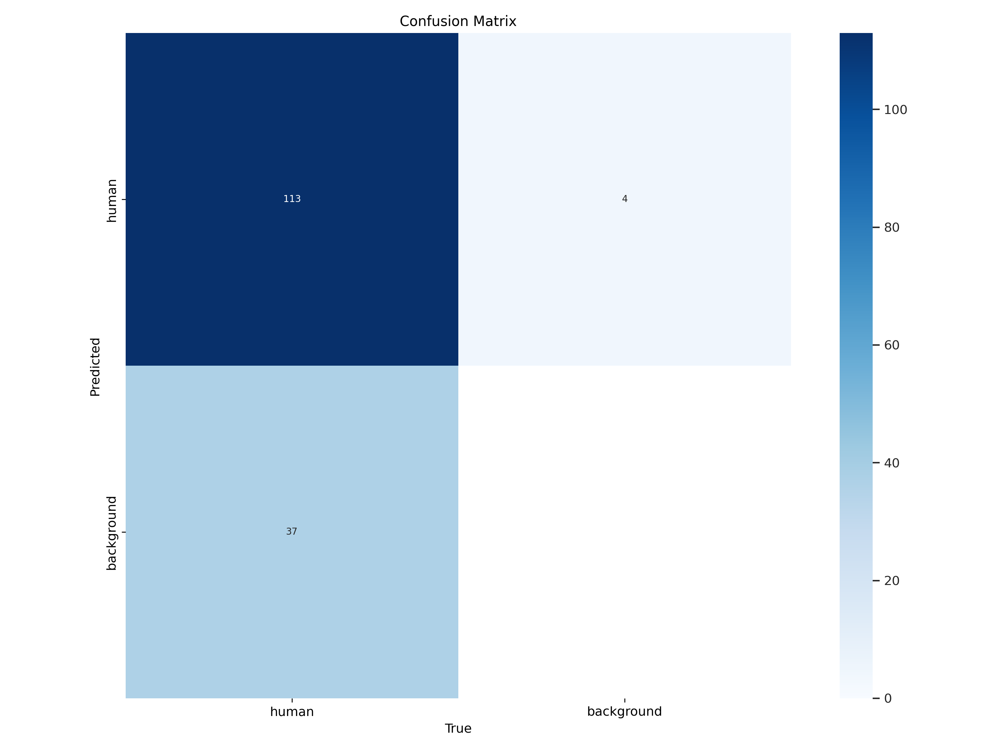

In [ ]:
%cd {HOME}
from IPython.display import Image
Image(filename=f'{HOME}/runs/pose/train/confusion_matrix.png', width=600)

/content


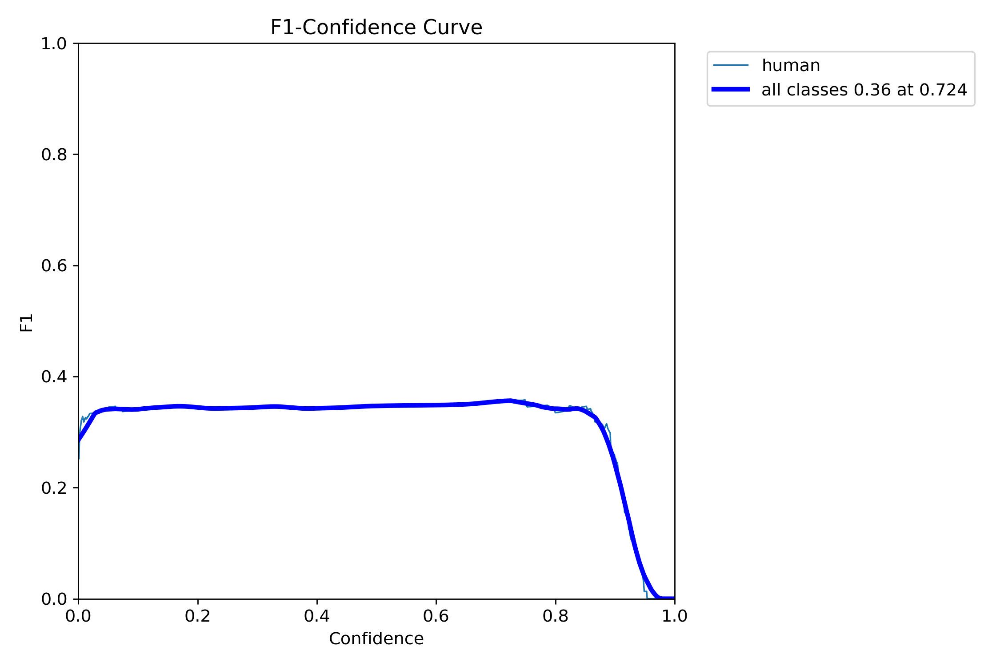

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/pose/train/PoseF1_curve.png', width=600)

/content


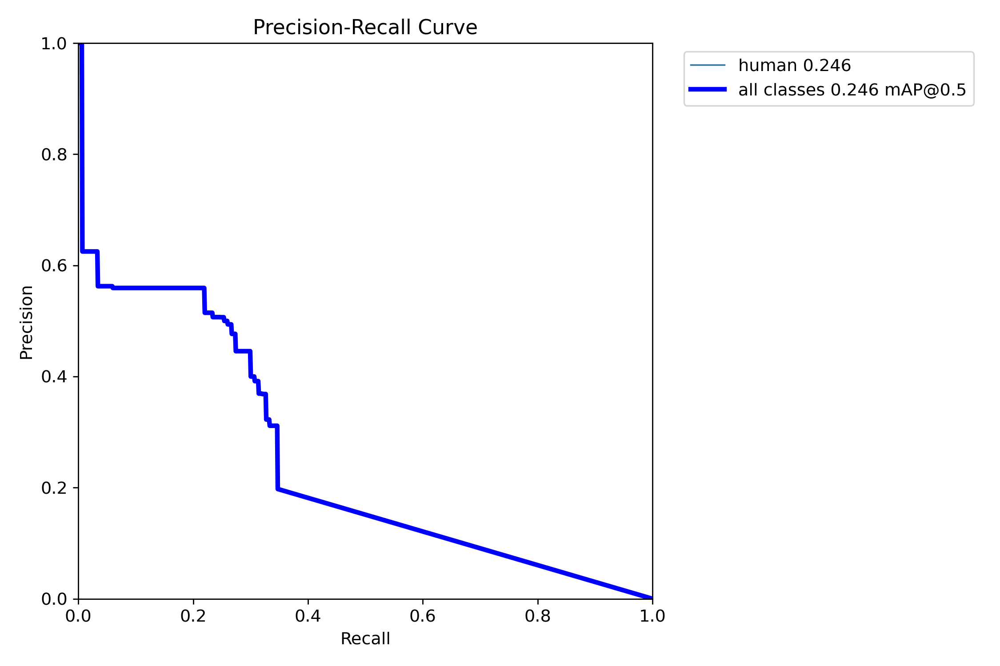

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/pose/train/PosePR_curve.png', width=600)

/content


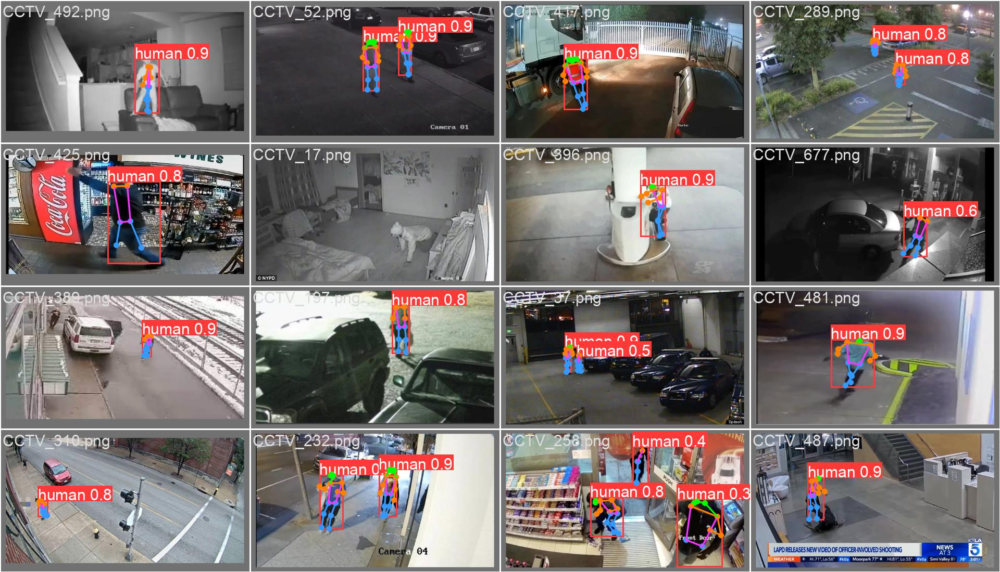

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/pose/train/val_batch0_pred.jpg', width=600)

# 🔵 **validate Custom Model**

In [42]:
%cd {HOME}

!yolo task=pose mode=val model=/content/best.pt data=/content/datasets/CCTV/data.yaml split=val

/content
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8l-pose summary (fused): 287 layers, 44465580 parameters, 0 gradients, 168.6 GFLOPs
100% 755k/755k [00:00<00:00, 23.2MB/s]
val: Scanning /content/datasets/CCTV/valid/labels... 105 images, 0 backgrounds, 1 corrupt: 100% 105/105 [00:00<00:00, 497.94it/s]
val: WARNING ⚠️ /content/datasets/CCTV/valid/images/CCTV_241.png: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0004]
val: New cache created: /content/datasets/CCTV/valid/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% 7/7 [00:10<00:00,  1.51s/it]
                   all        104        150      0.922       0.78      0.881      0.568      0.438        0.3      0.242      0.092
Speed: 2.5ms preprocess, 59.5ms inference, 0.0ms loss, 10.5ms postprocess per image
Results saved to runs/pose/val
💡 Learn m

In [43]:
%cd {HOME}

!yolo task=pose mode=val model=/content/best.pt data=/content/datasets/CCTV/data.yaml split=test

/content
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8l-pose summary (fused): 287 layers, 44465580 parameters, 0 gradients, 168.6 GFLOPs
val: Scanning /content/datasets/CCTV/test/labels... 105 images, 0 backgrounds, 0 corrupt: 100% 105/105 [00:00<00:00, 504.92it/s]
val: New cache created: /content/datasets/CCTV/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% 7/7 [00:08<00:00,  1.23s/it]
                   all        105        140      0.916      0.701      0.815      0.528      0.383      0.264      0.188     0.0736
Speed: 1.5ms preprocess, 55.1ms inference, 0.1ms loss, 8.6ms postprocess per image
Results saved to runs/pose/val2
💡 Learn more at https://docs.ultralytics.com/modes/val


In [45]:
from IPython.display import Image

/content


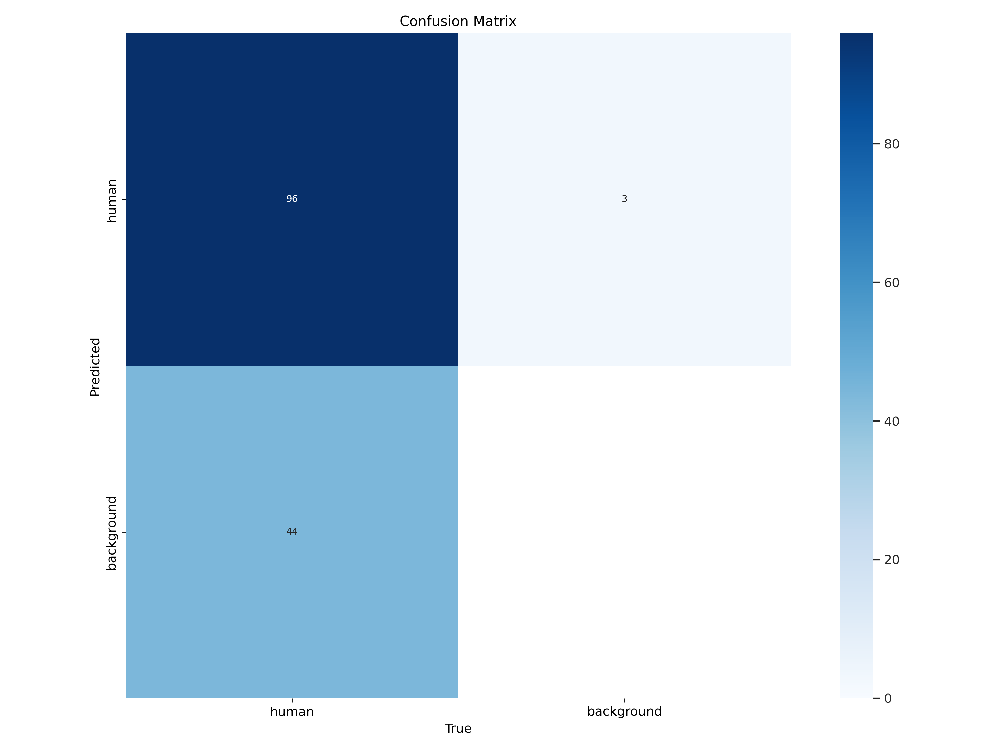

In [46]:
%cd {HOME}
Image(filename=f'/content/runs/pose/val2/confusion_matrix.png', width=600)

/content


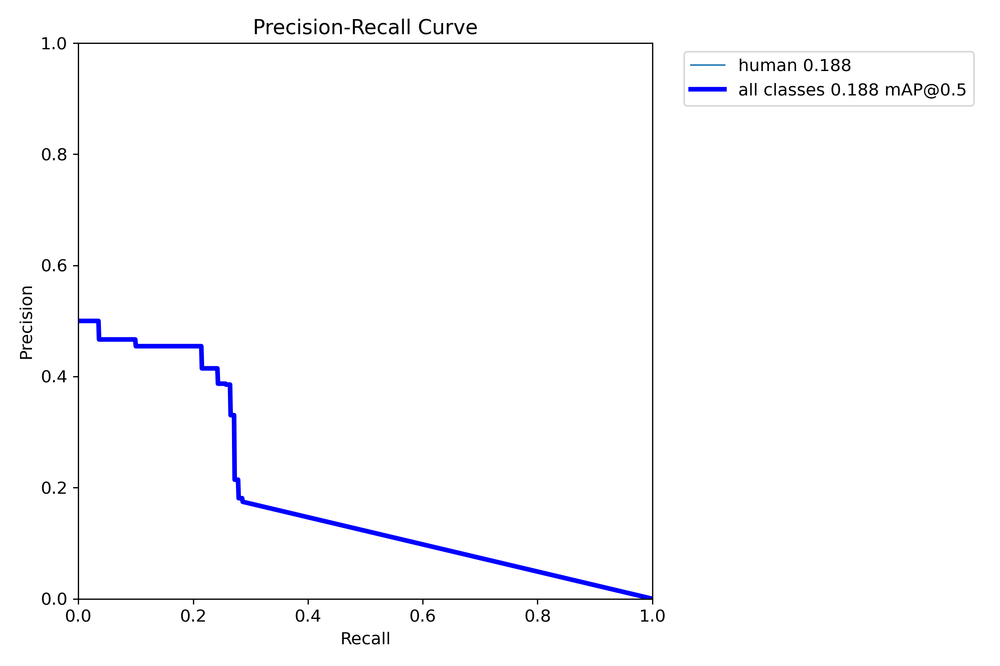

In [47]:
%cd {HOME}
Image(filename=f'/content/runs/pose/val2/PosePR_curve.png', width=600)

# 🔵 **Inference with Custom Model**

In [ ]:
%cd {HOME}
!yolo task=pose mode=predict model={HOME}/best.pt conf=0.4 source=/content/datasets/CCTV/test/images save=True

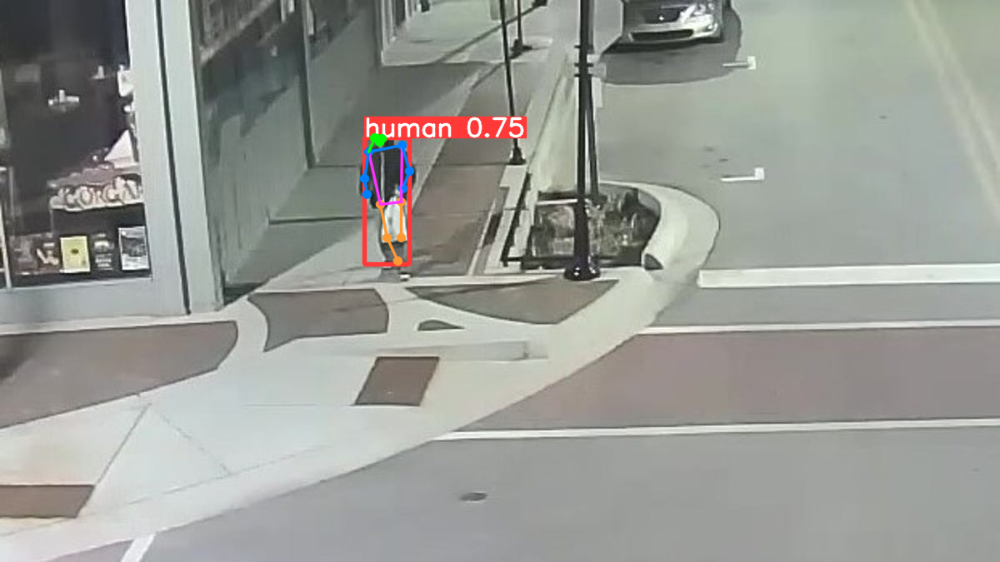

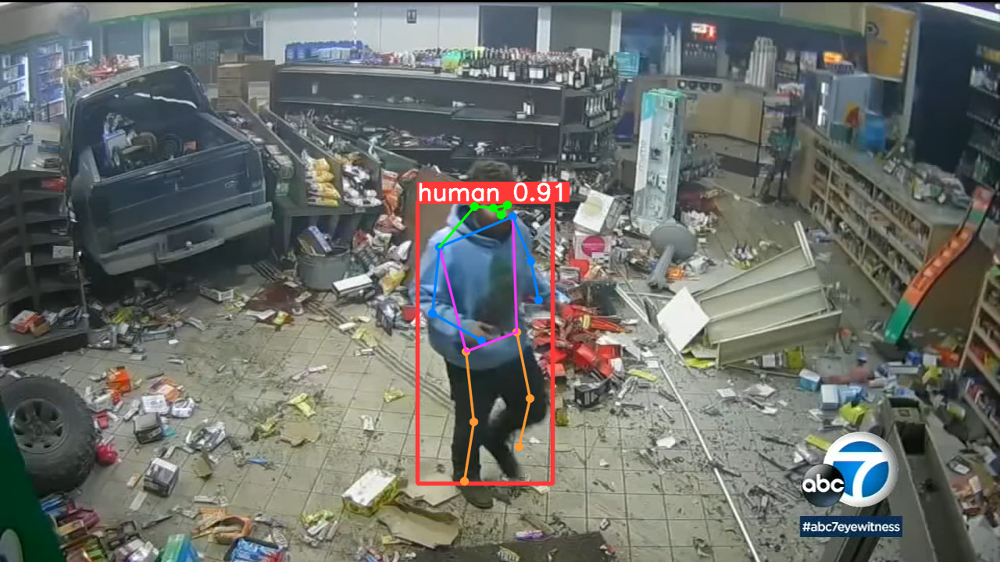

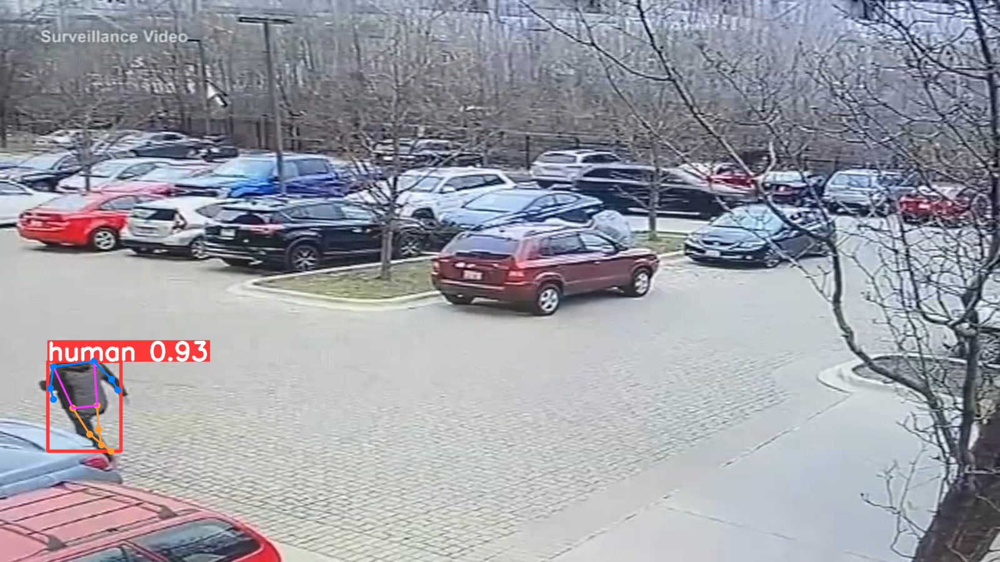

In [55]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/pose/predict/*.png')[35:38]:
      display(Image(filename=image_path, width=600))
      print("\n")

In [ ]:
!yolo task=pose mode=predict model={HOME}/best.pt conf=0.4 source=/content/CCTV2.mp4 save=True

In [66]:
from moviepy.editor import *

path="/content/runs/pose/predict4/CCTV2.avi"

clip=VideoFileClip(path)

In [ ]:
clip.ipython_display(width=600)